In [15]:
import numpy as np
import matplotlib.pyplot as plt
from pycqed.analysis import analysis_toolbox as a_tools
from importlib import reload
import matplotlib
matplotlib.rcParams.update({'font.size': 20})
a_tools.datadir = "Q:\\USERS\\nathan\\data"
from pycqed.measurement import calibration_points as c_p
from pycqed.measurement.waveform_control import pulsar as ps
from pycqed.measurement.waveform_control import segment as sg
import pycqed.utilities.general as gen
import pycqed.measurement.qaoa as qaoa

In [2]:
import time
t0 = time.time()  # to print how long init takes
import logging
from pprint import pprint

import collections
odict = collections.OrderedDict
from copy import deepcopy
from importlib import reload  # Useful for reloading while testing

import numpy as np
import matplotlib as mpl
import lmfit
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['figure.figsize'] = [7, 4]

import os; os.environ['PYGSTI_BACKCOMPAT_WARNING'] = '0'
import qutip as qtp

# Qcodes
import sys
import qcodes as qc

# makes sure logging messages show up in the notebook
log = logging.getLogger()
log.addHandler(logging.StreamHandler())

# Import a_tools first so that the datadir is correct in other modules that
# import it.
from pycqed.analysis import analysis_toolbox as a_tools


# General PycQED modules
from pycqed.utilities import general as gen
from pycqed.measurement import measurement_control as mc
from pycqed.measurement import detector_functions as det
from pycqed.measurement import sweep_functions as swf
from pycqed.measurement.waveform_control import pulsar as ps
from pycqed.measurement import awg_sweep_functions as awg_swf
from pycqed.measurement import awg_sweep_functions_multi_qubit as awg_swf2
from pycqed.analysis import measurement_analysis as ma
from pycqed.analysis_v2 import base_analysis as ba
# set good plotting parameters
default_plot_params_dict = ba.BaseDataAnalysis.get_default_plot_params(
    set_pars=True)
from pycqed.analysis_v2 import readout_analysis as ra
from pycqed.analysis_v2 import timedomain_analysis as tda
from pycqed.analysis_v2 import tomography_qudev as tomo
from pycqed.measurement import multi_qubit_module as mqm
from pycqedscripts.scripts.parking_positions import parking_diagram as \
    park_diag


# Instrument drivers
from pycqedscripts.drivers import Agilent_33250A as agil
from qcodes.instrument_drivers.rohde_schwarz import SGS100A as rs
from qcodes.instrument_drivers.stanford_research import SIM928 as srs
from qcodes.instrument_drivers.tektronix import AWG5014 as tek
from pycqed.instrument_drivers.virtual_instruments import virtual_awg5014, virtual_RSSGS100A, virtual_AWG8
from pycqed.instrument_drivers.meta_instrument.qubit_objects.QuDev_transmon \
    import QuDev_transmon, add_CZ_pulse
#from pycqedscripts.drivers import conversion_box_control as cbc
from pycqed.instrument_drivers.meta_instrument import TWPA as twpa_module
# from pycqed.instrument_drivers.physical_instruments.ZurichInstruments \
#     import UHFQuantumController as ziuhfqa
from pycqed.instrument_drivers.physical_instruments.ZurichInstruments \
    import dummy_UHFQC as ziuhfqa

from IPython.display import clear_output

###############################################################################
########################### Instrument creation ###############################
###############################################################################

station = qc.Station()
qc.station = station
MWG2 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG2', address='TCPIP0::192.168.1.32')
MWG4 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG4', address='TCPIP0::192.168.1.34')
MWG5 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG5', address='TCPIP0::192.168.1.35')
MWG6 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG6', address='TCPIP0::192.168.1.36')
MWG7 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG7', address='TCPIP0::192.168.1.37')
MWG8 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG8', address='TCPIP0::192.168.1.38')
MWG9 = virtual_RSSGS100A.virtualRohdeSchwarz_SGS100A(name='MWG9', address='TCPIP0::192.168.1.39')
AWG1 = virtual_awg5014.VirtualAWG5014(name='AWG1', timeout=20,
                             address='TCPIP0::192.168.1.4')
AWG2 = virtual_awg5014.VirtualAWG5014(name='AWG2', timeout=20,
                             address='TCPIP0::192.168.1.5')
AWG8 = virtual_AWG8.VirtualAWG8('AWG8')
# UHF = ziuhfqa.dummy_UHFQC('UHF', device='dev2249', port=8004, interface='1GbE')
UHF = ziuhfqa.dummy_UHFQC('UHF')


MC = mc.MeasurementControl('MC')
MC.datadir("Q:\\USERS\\nathan\\data")
pulsar = ps.Pulsar('Pulsar')

c:\users\nathan\masterthesis\code\controlsoftware\pycqed_py3\data


"UHFQuantumController" not imported.
"UHFQuantumController" not imported.


All images are saved in: 
C:\Users\nathan\masterthesis\code\pycqedscripts\pycqedscripts\scripts\parking_positions\plots


"readout_mode_simulations_for_CLEAR_pulse" not imported.


Initialized dummy UHFQC UHF in 0.05s


In [3]:
station.add_component(MC)
station.add_component(pulsar)
station.add_component(MWG2)
station.add_component(MWG4)
station.add_component(MWG5)
station.add_component(MWG6)
station.add_component(MWG7)
station.add_component(MWG8)
station.add_component(MWG9)
station.add_component(UHF, update_snapshot=False)
station.add_component(AWG1, update_snapshot=False)
station.add_component(AWG2, update_snapshot=False)
station.pulsar = pulsar

Snapshot: Could not update parameter: frequency on MWG2
Snapshot: Could not update parameter: phase on MWG2
Snapshot: Could not update parameter: power on MWG2
Snapshot: Could not update parameter: status on MWG2
Snapshot: Could not update parameter: pulsemod_state on MWG2
Snapshot: Could not update parameter: frequency on MWG4
Snapshot: Could not update parameter: phase on MWG4
Snapshot: Could not update parameter: power on MWG4
Snapshot: Could not update parameter: status on MWG4
Snapshot: Could not update parameter: pulsemod_state on MWG4
Snapshot: Could not update parameter: frequency on MWG5
Snapshot: Could not update parameter: phase on MWG5
Snapshot: Could not update parameter: power on MWG5
Snapshot: Could not update parameter: status on MWG5
Snapshot: Could not update parameter: pulsemod_state on MWG5
Snapshot: Could not update parameter: frequency on MWG6
Snapshot: Could not update parameter: phase on MWG6
Snapshot: Could not update parameter: power on MWG6
Snapshot: Could no

In [4]:
delays = {
    'AWG1': 0,
    'AWG2': 124*4/1.2e9,
    'AWG3': 125*4/1.2e9,
    'AWG8': 43*8/2.4e9,
    'UHF': 54*4/1.2e9,
}

trigger_channel_map = {
    'AWG1': [],
    'AWG2': ['AWG1_ch1m1'],
    'UHF': ['AWG1_ch4m1'],
    'AWG8': ['AWG1_ch2m1', 'AWG1_ch2m2', 'AWG1_ch3m1', 'AWG1_ch3m2']
}

offset_mode = {
    'AWG1': 'hardware',
    'AWG2': 'software',
    'AWG3': 'software',
}
for AWG in [AWG1, AWG2, AWG8, UHF]:
    pulsar.define_awg_channels(AWG)
    pulsar.set('{}_delay'.format(AWG.name), delays[AWG.name])
    pulsar.set('{}_compensation_pulse_min_length'.format(AWG.name), 4/(1.2e9))
    pulsar.set('{}_active'.format(AWG.name), True)
    pulsar.set('{}_trigger_channels'.format(AWG.name),
               trigger_channel_map[AWG.name])

    if isinstance(AWG, virtual_awg5014.VirtualAWG5014):
        for i in range(1, 5):
            pulsar.set('{}_ch{}_offset_mode'.format(AWG.name, i),
                       offset_mode[AWG.name])
            pulsar.set('{}_ch{}_amp'.format(AWG.name, i), 2)
            pulsar.set('{}_ch{}m1_amp'.format(AWG.name, i), 2.7)
            pulsar.set('{}_ch{}m2_amp'.format(AWG.name, i), 2.7)
            pulsar.set('{}_ch{}_offset'.format(AWG.name, i), 0)
            pulsar.set('{}_ch{}m1_offset'.format(AWG.name, i), 0)
            pulsar.set('{}_ch{}m2_offset'.format(AWG.name, i), 0)
    elif isinstance(AWG, virtual_AWG8.VirtualAWG8):
        for ch in pulsar.find_awg_channels(AWG.name):
            cid = pulsar.get(ch + '_id')
            AWG.set('sigouts_{}_direct'.format(int(cid[2]) - 1), 0)
            pulsar.set('{}_amp'.format(ch), 2.5)
            AWG.set('sigouts_{}_on'.format(int(cid[2]) - 1), True)
#             AWG._dev.seti('sines/{}/enables/0'.format(int(cid[2]) - 1), 0)
#             AWG._dev.seti('sines/{}/enables/1'.format(int(cid[2]) - 1), 0)
            AWG.set('triggers_in_{}_imp50'.format(int(cid[2]) - 1), 1)
            AWG.set('triggers_in_{}_level'.format(int(cid[2]) - 1), 0.5)
#         AWG._dev.seti('system/clocks/referenceclock/source', 1)
        for awg_nr in range(4):
            # First the DIO input (same as seen by HDAWG.awgs_0_dio_data() 
            # parameter) is bit shifted to the right by 
            # HDAWG.awgs_0_dio_mask_shift() bits. Then it is bitwise ANDed with 
            # HDAWG.awgs_0_dio_mask_value(). The result is what the playWaveDIO() 
            # command in the awg sequencer sees.
            AWG.set('awgs_{}_dio_mask_value'.format(awg_nr), 1)
            AWG.set('awgs_{}_dio_mask_shift'.format(awg_nr), 1)
            # The UHF outputs a 25MHz signal on pin 15
            AWG.set('awgs_{}_dio_strobe_index'.format(awg_nr), 15)
            # 1: rising edge, 2: falling edge or 3: both edges
            AWG.set('awgs_{}_dio_strobe_slope'.format(awg_nr), 3)
            # Choose any pin here
            AWG.set('awgs_{}_dio_valid_index'.format(awg_nr), 0)
            # 0: no valid bit needed, 1: low, 2: high
            AWG.set('awgs_{}_dio_valid_polarity'.format(awg_nr), 0)
            AWG.set('awgs_{}_auxtriggers_0_channel'.format(awg_nr),
                    2 * awg_nr + 1 - (awg_nr % 2))
            AWG.set('awgs_{}_auxtriggers_0_slope'.format(awg_nr), 1)

In [5]:
from pycqed.instrument_drivers.meta_instrument.qubit_objects.QuDev_transmon import QuDev_transmon
from pycqed.measurement import measurement_control as mc
from pycqed.measurement.waveform_control import segment as segm
from pycqed.measurement.waveform_control import sequence as sequ
from pycqed.measurement.pulse_sequences import single_qubit_tek_seq_elts as sqs

qb1 = QuDev_transmon('qb1')
qb2 = QuDev_transmon('qb2')
qb3 = QuDev_transmon('qb3')
qb4 = QuDev_transmon('qb4')

qubits = [qb1, qb2, qb3, qb4]
for qb in qubits:
    qb.instr_mc('MC')
    qb.instr_uhf('UHF')
    qb.ro_I_channel('UHF_ch1')
    qb.ro_Q_channel('UHF_ch2')


In [6]:
from pycqed.instrument_drivers.meta_instrument.qubit_objects import QuDev_transmon as QdvTrmn

# add two qb gates
QdvTrmn.add_CZ_pulse(qb1, qb2)
QdvTrmn.add_CZ_pulse(qb3, qb2)
QdvTrmn.add_CZ_pulse(qb4, qb3)
upcz_pulse_names = dict()

In [56]:
# plotstyle
fig_size_dim    = 8
golden_ratio    = (1+np.sqrt(5))/2
fig_size        = (fig_size_dim, fig_size_dim/golden_ratio)

def plot_style():
    font_size       = 16
    marker_size     = 6
    line_width      = 2.5
    axes_line_width = 1
    tick_length     = 5
    tick_width      = 1
    tick_color      = 'k'
    ticks_direction = 'in'
    axes_labelcolor = 'k'
    dpi             =  300

    params = {'figure.figsize': fig_size,
              'figure.dpi': dpi,
              'savefig.dpi': dpi,
              'font.size': font_size,
              'font.family': "DINPro",#"cmss10", #"DINPro", # to manage to use dinpro, put ttf files in site-packages/matplotlib/mpl-data/fonts
              'mathtext.default': 'it',
              'mathtext.fontset': "cm",
              'mathtext.it': 'cm',
              'figure.titlesize': font_size,
              'legend.fontsize': font_size,
              'axes.labelsize': font_size,
              'axes.labelcolor': axes_labelcolor,
              'axes.titlesize': font_size,
              'axes.linewidth': axes_line_width,
              'lines.markersize': marker_size,
              'lines.linewidth': line_width,
              'xtick.direction': ticks_direction,
              'ytick.direction': ticks_direction,
              'xtick.labelsize': font_size,
              'ytick.labelsize': font_size,
              'xtick.color': tick_color,
              'ytick.color': tick_color,
              'xtick.major.size': tick_length,
              'ytick.major.size': tick_length,
              'xtick.major.width': tick_width,
              'ytick.major.width': tick_width,
              'xtick.top': True,
              'xtick.bottom': True,
              'ytick.left': True,
              'ytick.right': True,
              'axes.formatter.useoffset': False,

              # LEGEND
            'legend.loc'           : 'best',
            'legend.frameon'       : False,     ## if True, draw the legend on a background patch
    #         'legend.framealpha'    : 0.8,      ## legend patch transparency
    #         'legend.facecolor'     : 'inherit',  ## inherit from axes.facecolor; or color spec
    #         'legend.edgecolor'     : 0.8,      ## background patch boundary color
    #         'legend.fancybox'      : True,     ## if True, use a rounded box for the
                                             ## legend background, else a rectangle
                }

    plt.rcParams.update(params)
plot_style()

# Get Lengths

In [11]:
qbc = qb1
qbt = qb2
qbc2 = qb3
qbt2 = qb2
qbs = [qbc, qbt, qbc2]
qb_names = [qb.name for qb in qbs]

optimal_params={
    1:dict(g=[0.67848787], b=[3.9269908]),
    2: dict(g=[0.64186931,1.15633934], b=[1.08778431,0.56831448]),
    3: dict(g=[ 0.91293813,  1.38149213,  2.64575812], b=[4.25592023,  6.8627972,  -0.47658777]),
    4: dict(g= [0.79047109, 1.29788154, 2.65529822, 1.02307546 ], b=[ 0.9663438, 3.66163585, 5.75941282 ,6.01503621]),
    5: dict(g = [0.62732382, 0.00640932, 1.21334409, 0.32948633, 1.03519245], b=[0.21928593 ,1.03185706, 0.84183517, 3.16511823, 3.56522479] ),
    6: dict(g=[1.03885048, 1.35146962, 2.06623968, 2.43631484, 3.12286653, 2.84845525], 
            b=[5.16561146, 4.02608211, 5.61752595, 6.82999765, 0.340696,   0.93796757]),
    7: dict(g=[ 1.13027127,  2.39374872, -0.35931365,  3.47810144,  1.62313939 , 0.16434764, 0.75164923], b=[  1.60770037,  2.89058529 , 1.63604546 , 1.33216744 , 1.46064182, 5.68443475,  3.85156408] ),
    8: dict(g=[1.055365503442032,1.3098777325119684,1.7014313196688995,1.147763909186312,0.6952683724838693,2.4871574459657615,2.162997348460366,2.368623128268789], b=[6.700351002594094,2.750288054308348,1.8334785312398794,1.4997245667843095,3.973993966376086,3.124898728718041,5.88391836689478,5.80487108919712]),
    9: dict(g=[2.255384671867681,1.1263556452930128,2.3564798544033287,0.4540511845994959,0.45683699857291366,0.42311647779005124,2.6114716195550667,0.7300887629608801,1.9252202179959783], b=[4.099035024586171,1.1189046530120206,2.6440433383427684,0.3914697152007607,3.797694667114474,0.47789898540596154,4.662660755443585,2.370377288094952,2.4849199081896343]),
    10:dict(g=[1.940897768208033,0.9666844823356445,2.772132044860666,2.309917454663161,3.3445826894178183,1.1224922614360544,2.5426242774323127,3.4136236280179553,-0.16948225188854313,1.9267825683628026], b=[1.77851179850078,2.2033574267981217,1.4819516119903635,4.480386169071666,2.495939695232518,0.07321215272329895,6.294539837569337,2.3051562674962494,2.244969010609862,5.373081388770109]),
    
}

## Direct implementation

In [35]:
%matplotlib notebook

U_0:
phase angle: 4.926209567179586
Ampl: 1.6013064345045176
dyn_phase: 5695.641181078621
U_0:
phase angle: 3.5692338271795863
Ampl: 0.46385852545851913
dyn_phase: -1123.8226055408477


c:\users\nathan\masterthesis\code\env\lib\site-packages\h5py\_hl\dataset.py:313: H5pyDeprecationWarning:

dataset.value has been deprecated. Use dataset[()] instead.



<IPython.core.display.Javascript object>


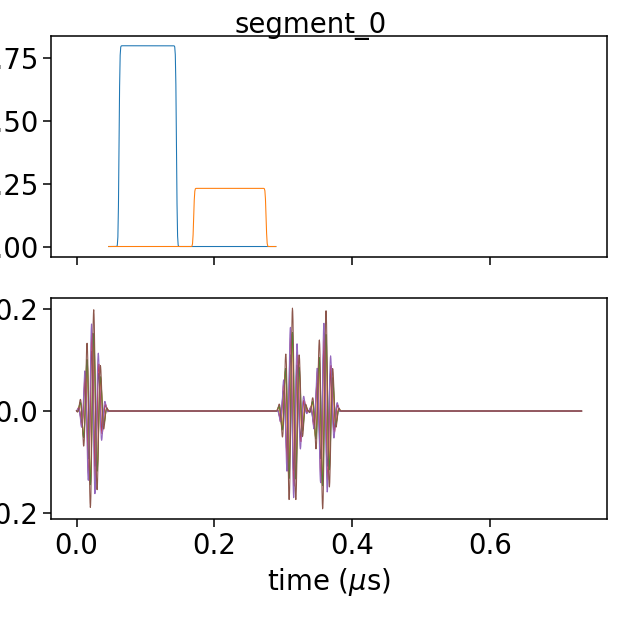

U_0:
phase angle: 4.999446687179586
Ampl: 1.6033048844073714
dyn_phase: 5568.346757589019
U_0:
phase angle: 3.715708067179586
Ampl: 0.4660457600307848
dyn_phase: -1127.0925334455023
U_1:
phase angle: 3.9705066271795864
Ampl: 1.582990289991828
dyn_phase: 6549.913174433411
U_1:
phase angle: 1.6578279471795865
Ampl: 0.43043859705423904
dyn_phase: -619.8166490003567


<IPython.core.display.Javascript object>


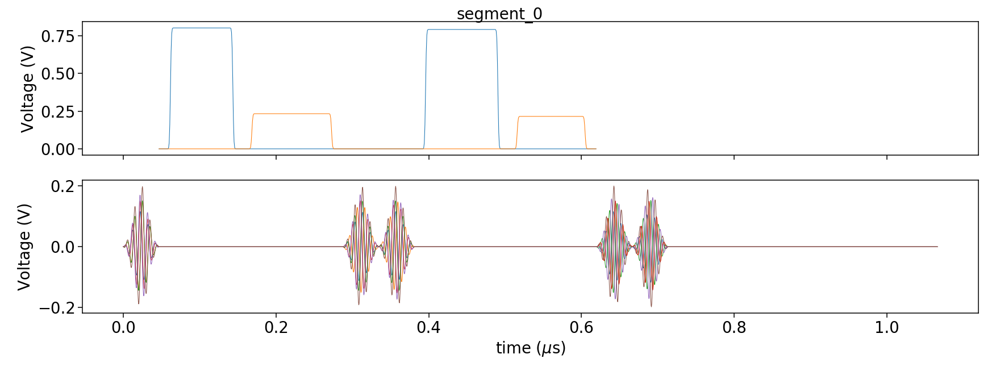

U_0:
phase angle: 4.457309047179586
Ampl: 1.5909659562557923
dyn_phase: 6247.171962407086
U_0:
phase angle: 2.631432787179586
Ampl: 0.449769018992537
dyn_phase: -989.2970868193676
U_1:
phase angle: 3.520201047179586
Ampl: 1.5766954475617687
dyn_phase: 6654.7028092639275
U_1:
phase angle: 0.7572167871795861
Ampl: 0.3797805917360939
dyn_phase: 92.09966235581847
U_2:
phase angle: 0.9916690671795862
Ampl: 1.5404305049471376
dyn_phase: 3958.7224956642144
U_2:
phase angle: 1.9833381343591725
Ampl: 0.43795573280444194
dyn_phase: -772.255797094565


<IPython.core.display.Javascript object>


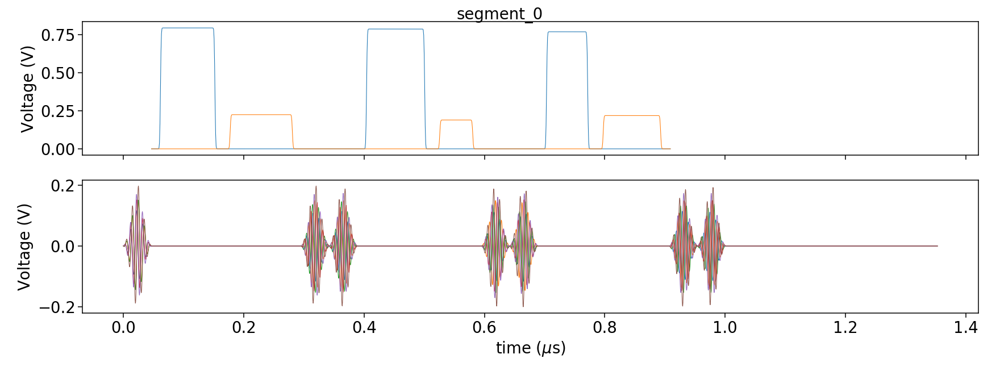

U_0:
phase angle: 4.702243127179586
Ampl: 1.5957408479036093
dyn_phase: 6003.653670276183
U_0:
phase angle: 3.121300947179586
Ampl: 0.4573546648247085
dyn_phase: -1084.4156763090905
U_1:
phase angle: 3.6874222271795865
Ampl: 1.578748739371949
dyn_phase: 6624.258463157312
U_1:
phase angle: 1.0916591471795867
Ampl: 0.408810268744024
dyn_phase: -237.76843461701995
U_2:
phase angle: 0.9725888671795859
Ampl: 1.539947681402
dyn_phase: 3906.5338727709295
U_2:
phase angle: 1.9451777343591719
Ampl: 0.4371700864077464
dyn_phase: -756.5290354167705
U_3:
phase angle: 4.237034387179586
Ampl: 1.5873794417097447
dyn_phase: 6400.301216895815
U_3:
phase angle: 2.190883467179586
Ampl: 0.44222867655978326
dyn_phase: -858.9111252485357


<IPython.core.display.Javascript object>


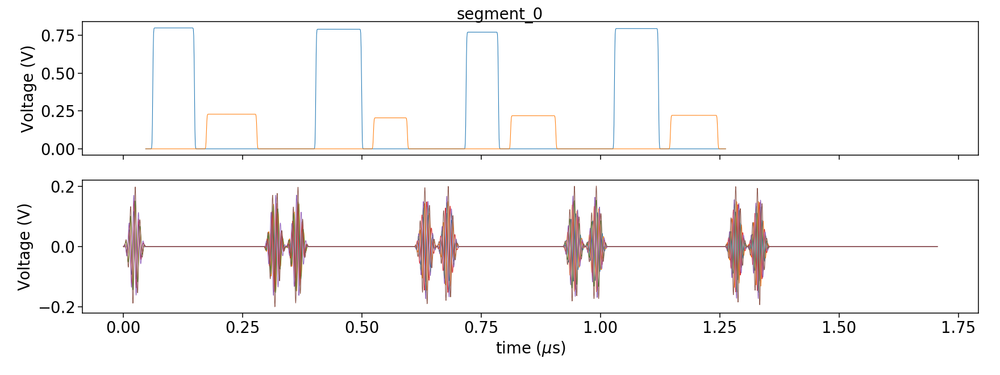

U_0:
phase angle: 5.028537667179586
Ampl: 1.6040987013427577
dyn_phase: 5518.976094996362
U_0:
phase angle: 3.7738900271795863
Ampl: 0.4669145653196477
dyn_phase: -1128.5315664247314
U_1:
phase angle: 6.270366667179586
Ampl: 1.7421888238334489
dyn_phase: 1326.537557071297
U_1:
phase angle: 6.2575480271795865
Ampl: 0.54545455
dyn_phase: -462.99501012
U_2:
phase angle: 3.856497127179586
Ampl: 1.5811086283362787
dyn_phase: 6583.153274637132
U_2:
phase angle: 1.4298089471795858
Ampl: 0.4234926553097847
dyn_phase: -486.19755488224854
U_3:
phase angle: 5.624212647179586
Ampl: 1.627778764332914
dyn_phase: 4180.218022976756
U_3:
phase angle: 4.9652399871795865
Ampl: 0.48811491802656887
dyn_phase: -1018.3555268835947
U_4:
phase angle: 4.212800407179586
Ampl: 1.5869848637688295
dyn_phase: 6417.498012319811
U_4:
phase angle: 2.142415507179586
Ampl: 0.4412308180957949
dyn_phase: -839.6259280974771


<IPython.core.display.Javascript object>


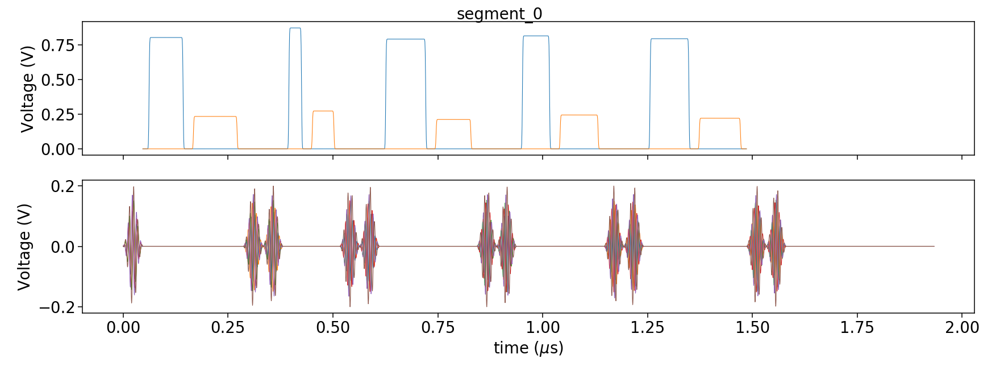

U_0:
phase angle: 4.205484347179587
Ampl: 1.5868657435958156
dyn_phase: 6422.689598148053
U_0:
phase angle: 2.127783387179586
Ampl: 0.4409295719779865
dyn_phase: -833.0293180218938
U_1:
phase angle: 3.580246067179586
Ampl: 1.5774327342368664
dyn_phase: 6646.576956656058
U_1:
phase angle: 0.8773068271795861
Ampl: 0.3949444683052405
dyn_phase: -50.868326359404065
U_2:
phase angle: 2.1507059471795866
Ampl: 1.5607481435269797
dyn_phase: 5879.02152708524
U_2:
phase angle: 4.301411894359173
Ampl: 0.47502884096366305
dyn_phase: -1115.9686388373138
U_3:
phase angle: 1.410555627179586
Ampl: 1.5496333607739978
dyn_phase: 4852.593468577964
U_3:
phase angle: 2.821111254359172
Ampl: 0.45293817431378824
dyn_phase: -1034.1020083862968
U_4:
phase angle: 0.03745224717958617
Ampl: 1.775917504313901
dyn_phase: 922.7258392354928
U_4:
phase angle: 0.07490449435917235
Ampl: 0.5665174310715232
dyn_phase: -338.25166870290934
U_5:
phase angle: 0.5862748071795858
Ampl: 1.5241904293069106
dyn_phase: 2606.4583470

<IPython.core.display.Javascript object>


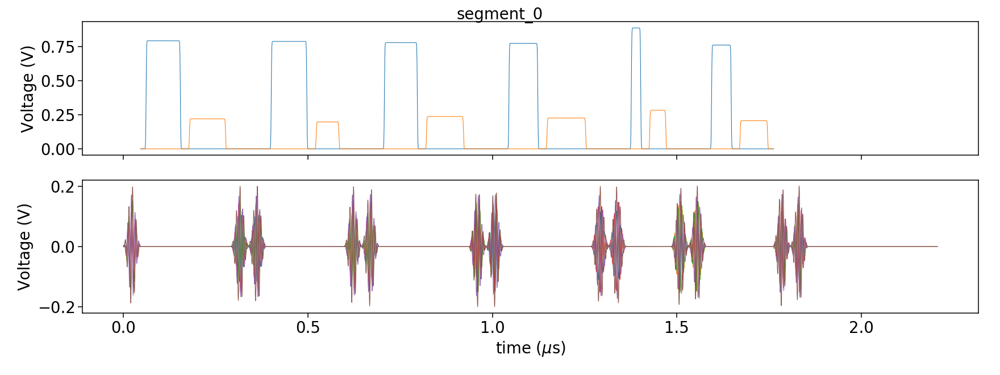

U_0:
phase angle: 4.022642767179587
Ampl: 1.5838507671933448
dyn_phase: 6536.78279984391
U_0:
phase angle: 1.7621002271795865
Ampl: 0.433400886298952
dyn_phase: -681.5710482028214
U_1:
phase angle: 1.4956878671795861
Ampl: 1.5511522912775095
dyn_phase: 4978.28164130831
U_1:
phase angle: 2.9913757343591723
Ampl: 0.4554700296826618
dyn_phase: -1069.2265804667659
U_2:
phase angle: 0.7186273
Ampl: 1.531268748124131
dyn_phase: 3121.8638544593014
U_2:
phase angle: 1.4372546
Ampl: 0.42371946566655333
dyn_phase: -490.35252249410263
U_3:
phase angle: 5.610167734359172
Ampl: 1.6269567775120415
dyn_phase: 4220.38379705727
U_3:
phase angle: 4.937150161538758
Ampl: 0.4874883837626935
dyn_phase: -1024.1127717483844
U_4:
phase angle: 3.0369065271795863
Ampl: 1.571041719429776
dyn_phase: 6515.120089785922
U_4:
phase angle: 6.073813054359173
Ampl: 0.5314810496166466
dyn_phase: -570.6847129467566
U_5:
phase angle: 5.954490027179586
Ampl: 1.6583025931088313
dyn_phase: 3006.5563095312723
U_5:
phase angle:

<IPython.core.display.Javascript object>


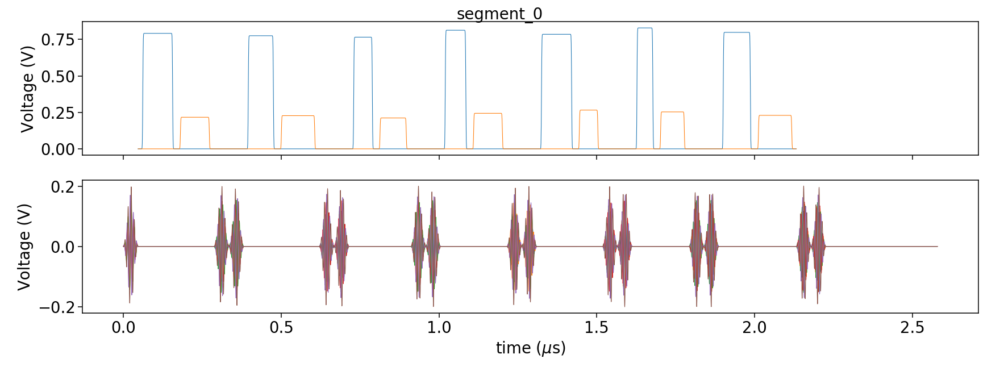

U_0:
phase angle: 4.172454300295522
Ampl: 1.5863233209491572
dyn_phase: 6444.166135762456
U_0:
phase angle: 2.0617232934114584
Ampl: 0.43956952662641
dyn_phase: -804.4564530740287
U_1:
phase angle: 3.6634298421556495
Ampl: 1.5784541393238192
dyn_phase: 6628.836303088402
U_1:
phase angle: 1.0436743771317127
Ampl: 0.40608461739025736
dyn_phase: -199.42463762109713
U_2:
phase angle: 2.8803226678417873
Ampl: 1.5693287825424274
dyn_phase: 6468.053967333558
U_2:
phase angle: 5.7606453356835745
Ampl: 0.5123783391154036
dyn_phase: -754.6764524930473
U_3:
phase angle: 3.987657488806962
Ampl: 1.5832733551634484
dyn_phase: 6545.4376121002115
U_3:
phase angle: 1.6921296704343378
Ampl: 0.43148350020468657
dyn_phase: -641.4599053067808
U_4:
phase angle: 4.892648562211848
Ampl: 1.600390642251662
dyn_phase: 5750.607221207519
U_4:
phase angle: 3.502111817244109
Ampl: 0.46287853146011654
dyn_phase: -1121.0872785133522
U_5:
phase angle: 1.3088704152480632
Ampl: 1.54781909193579
dyn_phase: 4698.9719512279

<IPython.core.display.Javascript object>


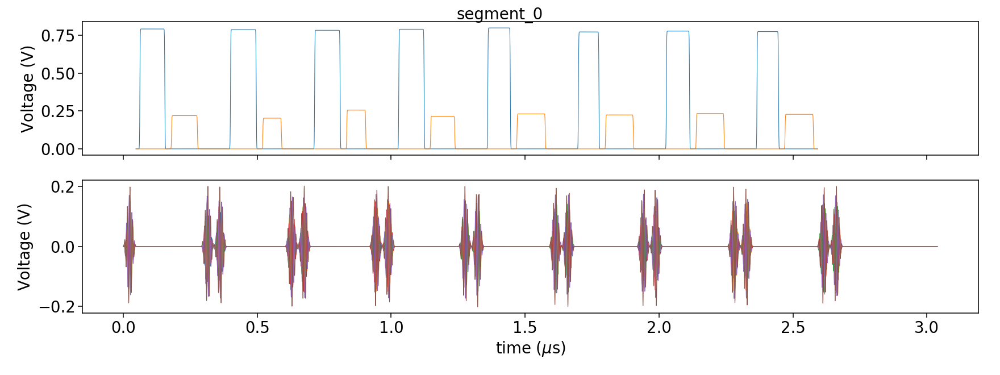

U_0:
phase angle: 1.7724159634442245
Ampl: 1.5555185415863475
dyn_phase: 5375.392314040101
U_0:
phase angle: 3.544831926888449
Ampl: 0.4634982096438967
dyn_phase: -1122.8810507550315
U_1:
phase angle: 4.03047401659356
Ampl: 1.583980017490358
dyn_phase: 6534.850611294569
U_1:
phase angle: 1.777762726007535
Ampl: 0.4337233458582707
dyn_phase: -687.9041907598208
U_2:
phase angle: 1.5702255983729287
Ampl: 1.552482194420809
dyn_phase: 5091.568173135411
U_2:
phase angle: 3.1404511967458575
Ampl: 0.45763244950197085
dyn_phase: -1086.3284657954455
U_3:
phase angle: 5.3750829379805944
Ampl: 1.6154683695799736
dyn_phase: 4815.01240237146
U_3:
phase angle: 4.466980568781603
Ampl: 0.4781325682283276
dyn_phase: -1100.1759809882863
U_4:
phase angle: 5.369511310033759
Ampl: 1.615237329802934
dyn_phase: 4829.050901928776
U_4:
phase angle: 4.455837312887931
Ampl: 0.4779236783084501
dyn_phase: -1101.8845228753478
U_5:
phase angle: 5.4369523515994835
Ampl: 1.618033920557979
dyn_phase: 4677.925872569381
U

<IPython.core.display.Javascript object>


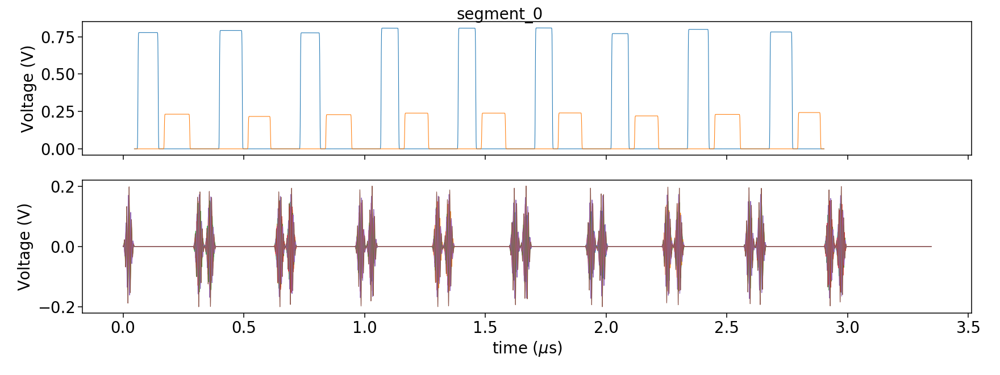

U_0:
phase angle: 2.40138977076352
Ampl: 1.5637993085904418
dyn_phase: 6101.731201875641
U_0:
phase angle: 4.80277954152704
Ampl: 0.4844912915567117
dyn_phase: -1052.5242893015775
U_1:
phase angle: 4.349816342508297
Ampl: 1.589215758802769
dyn_phase: 6322.078603167547
U_1:
phase angle: 2.416447377837008
Ampl: 0.4461770342820936
dyn_phase: -926.9051432982615
U_2:
phase angle: 0.7389212174582545
Ampl: 1.5321711658998476
dyn_phase: 3196.217778560628
U_2:
phase angle: 1.477842434916509
Ampl: 0.42495585709386247
dyn_phase: -514.0433871703925
U_3:
phase angle: 1.6633503978532644
Ampl: 1.5539758076665715
dyn_phase: 5227.045162030351
U_3:
phase angle: 3.326700795706529
Ampl: 0.46033410018064674
dyn_phase: -1106.1038617770423
U_4:
phase angle: 5.877205235523536
Ampl: 1.6483653407114993
dyn_phase: 3336.5969846137777
U_4:
phase angle: 5.471225163867485
Ampl: 0.5012883825947781
dyn_phase: -871.8763118941648
U_5:
phase angle: 4.038200784307477
Ampl: 1.5841075433766096
dyn_phase: 6531.184432539631
U

<IPython.core.display.Javascript object>


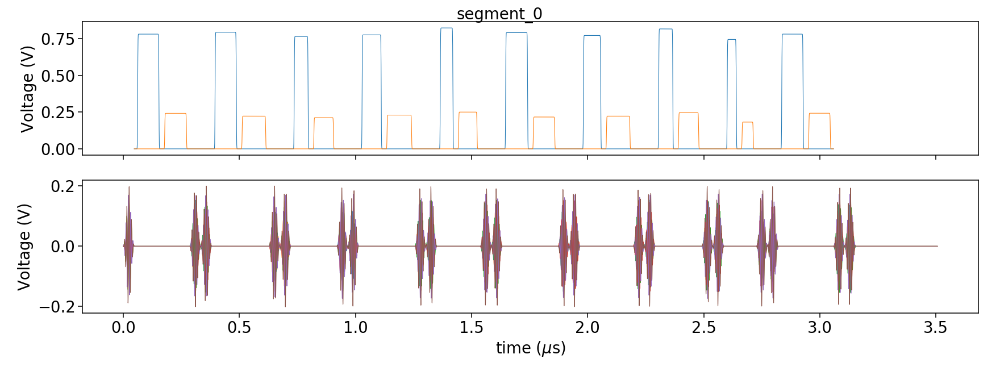

In [40]:
a_tools.datadir = "Y:"
timestamp = "20191203_191009"
for qb in qubits:
    gen.load_settings(qb, timestamp=timestamp)
clear_output()


a = ma.MeasurementAnalysis(timestamp=timestamp, auto=False)
a.get_naming_and_values()
two_qb_gate_info = eval(a.exp_metadata['two_qb_gates_info'])

lengths_hw = []

for d, opt_param in optimal_params.items():
    s, _ = qaoa.qaoa_sequence(qb_names, opt_param["b"], opt_param["g"],
                  two_qb_gate_info, mqm.get_operation_dict(qbs), 
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="hardware", 
                              init_state="+",
                         upload=False)
#     fig, axes = s.segments["segment_0"].plot(instruments=['UHF'])
    fig, axes = s.segments["segment_0"].plot(instruments=['AWG2', 'AWG8'], legend=False)
    lengths_hw.append(axes[0][0].lines[0].get_xdata()[0])

In [29]:
lengths_hw

[0.38222222222222224,
 0.711111111111111,
 1.0,
 1.3511111111111112,
 1.5777777777777777,
 1.8533333333333333,
 2.222222222222222,
 2.6844444444444444,
 2.9955555555555553,
 3.1511111111111108]

### Pulse scheme

In [78]:
channel_map = dict(
              qb1=['AWG8_ch1', "AWG2_ch3"],
              qb2=['AWG8_ch3',],
              qb3=['AWG8_ch5', "AWG2_ch1"])
cmap = plt.get_cmap('Dark2')
c_dir, c_dec = ['#3673AF', "#39B265" ]

c:\users\nathan\masterthesis\code\env\lib\site-packages\h5py\_hl\dataset.py:313: H5pyDeprecationWarning:

dataset.value has been deprecated. Use dataset[()] instead.



U_0:
phase angle: 4.926209567179586
Ampl: 1.6013064345045176
dyn_phase: 5695.641181078621
U_0:
phase angle: 3.5692338271795863
Ampl: 0.46385852545851913
dyn_phase: -1123.8226055408477


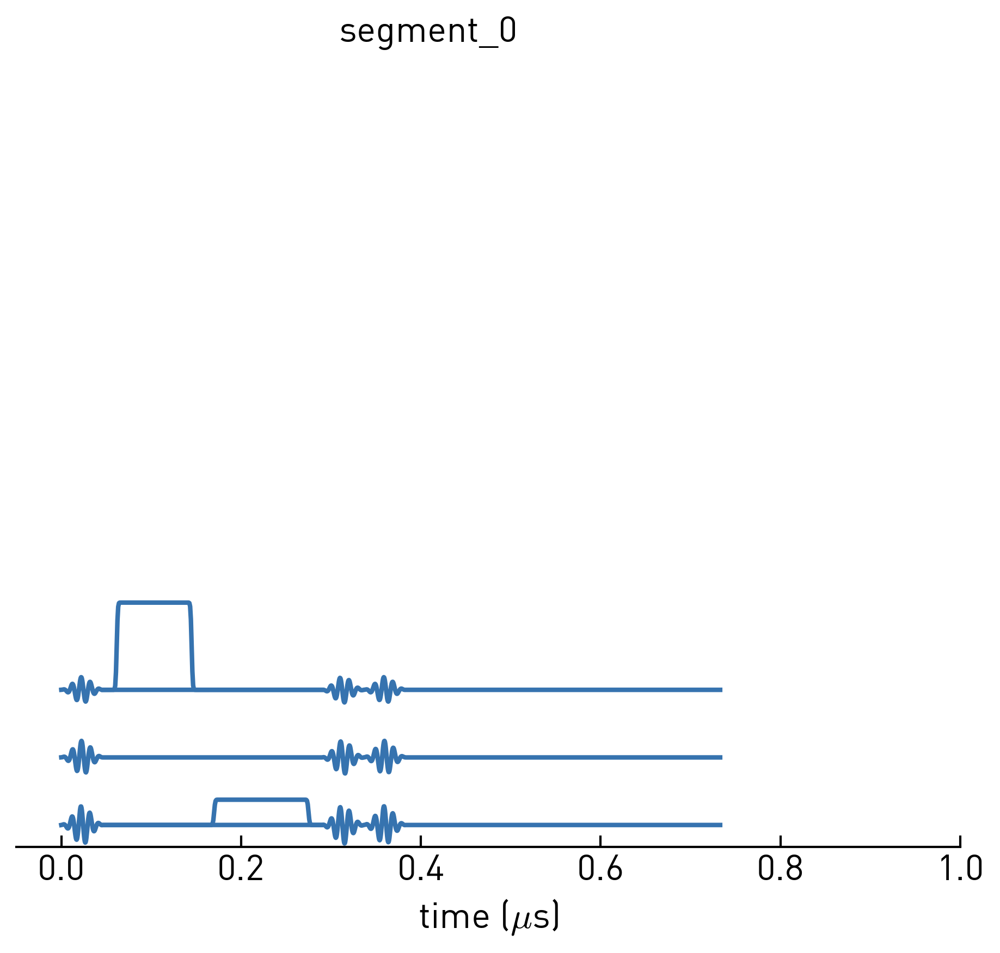

In [117]:
reload(segm)
a_tools.datadir = "Y:"
timestamp = "20191203_191009"
for qb in qubits:
    gen.load_settings(qb, timestamp=timestamp)
clear_output()


a = ma.MeasurementAnalysis(timestamp=timestamp, auto=False)
a.get_naming_and_values()
two_qb_gate_info = eval(a.exp_metadata['two_qb_gates_info'])

plot_kwargs=dict(linewidth=2)
fig, ax = plt.subplots(nrows=3, squeeze=False, sharex=True, figsize=(7,6))
for opt_param in [optimal_params[1]]:
    s, _ = qaoa.qaoa_sequence(qb_names, opt_param["b"], opt_param["g"],
                  two_qb_gate_info, mqm.get_operation_dict(qbs), 
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="hardware", 
                              init_state="+",
                         upload=False)
#     fig, axes = s.segments["segment_0"].plot(instruments=['UHF'])
    s.segments["segment_0"].plot(axes=ax, channel_map=channel_map, frameon=dict(top=False, right=False, left=False), plot_kwargs=plot_kwargs,
            prop_cycle=dict(color=[c_dir]), legend=False, demodulate=False)
    
plt.subplots_adjust(hspace=-0.9)
for i, a in enumerate(ax.flatten()):
    
    a.tick_params(top=False, right=False, bottom=False)
    a.axis('off')
    a.yaxis.set_ticks([])
    a.set_ylabel("")
    a.set_ylim([-0.2, 6])
    a.set_xlim([-0.05, 1])
#         ax.patch.set_facecolor(c_dec)
    a.patch.set_alpha(0)
    if i == 0:
        a.set_ylim([-0.2, 6])
    if i == 2:
        a.axis('on')
        a.xaxis.set_visible(True)
        a.tick_params(bottom=True)
#         a.set_ylim([-0.4, 0.8])

## Decomposed implementation

In [53]:
timestamp = '20191204_172124' 
for qb in qubits:
    gen.load_settings(qb, timestamp=timestamp)
    
clear_output()

lengths_sw = []

for d, opt_param in optimal_params.items():
    s, _ = qaoa.qaoa_sequence(qb_names, opt_param["b"],  opt_param["g"],
                  two_qb_gate_info, mqm.get_operation_dict(qbs), 
                              init_state="+",
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="software", 
                         upload=False)
    fig, axes = s.segments["segment_0"].plot(instruments=['AWG2', 'AWG8'])
    lengths_sw.append(axes[0][0].lines[0].get_xdata()[0])

clear_output()

In [23]:
lengths_sw

[1.0222222222222221,
 2.0,
 2.982222222222222,
 3.9600000000000004,
 4.937777777777778,
 5.915555555555555,
 6.8933333333333335,
 7.875555555555556,
 8.853333333333332,
 9.83111111111111]

### Pulse scheme

In [78]:
channel_map = dict(
              qb1=['AWG8_ch1', "AWG2_ch3"],
              qb2=['AWG8_ch3',],
              qb3=['AWG8_ch5', "AWG2_ch1"])
cmap = plt.get_cmap('Dark2')
c_dir, c_dec = ['#3673AF', "#39B265" ]

c:\users\nathan\masterthesis\code\env\lib\site-packages\h5py\_hl\dataset.py:313: H5pyDeprecationWarning:

dataset.value has been deprecated. Use dataset[()] instead.



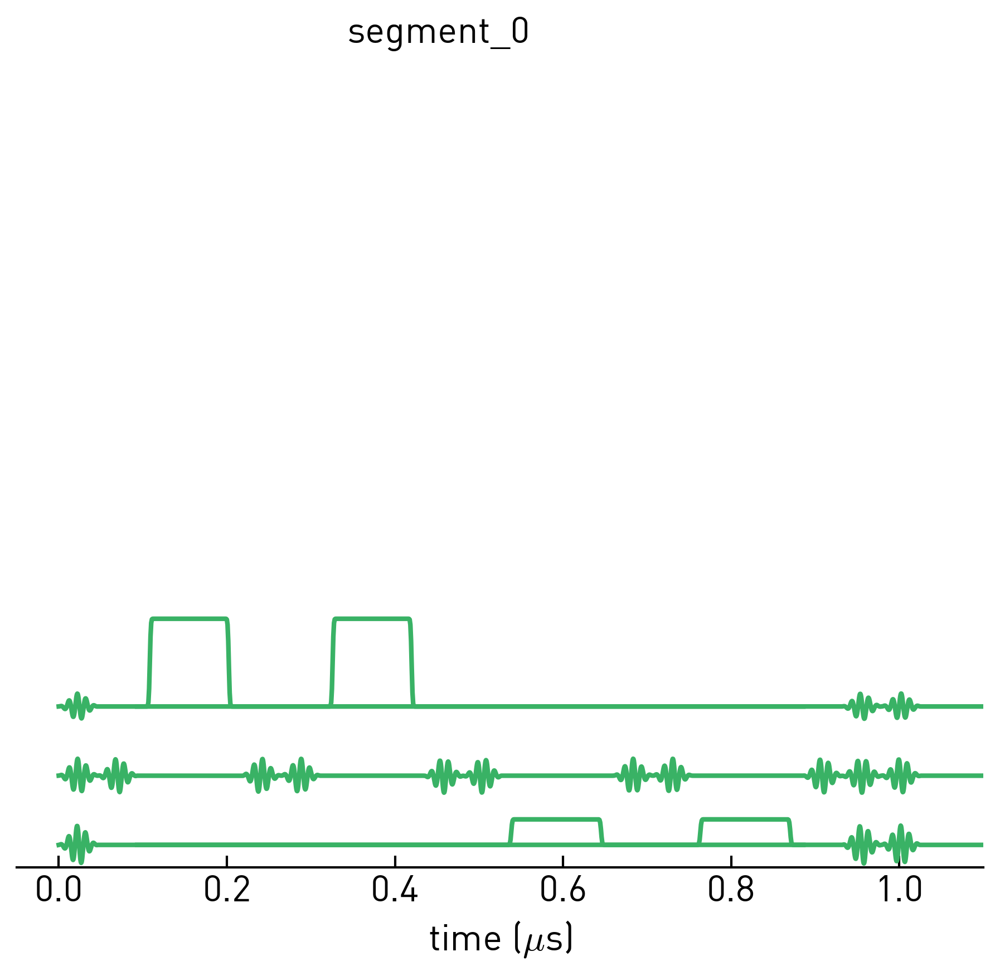

In [114]:
reload(segm)
a_tools.datadir = "Y:"
timestamp = "20191204_172124"
for qb in qubits:
    gen.load_settings(qb, timestamp=timestamp)
clear_output()


a = ma.MeasurementAnalysis(timestamp=timestamp, auto=False)
a.get_naming_and_values()
two_qb_gate_info = eval(a.exp_metadata['two_qb_gates_info'])

plot_kwargs=dict(linewidth=2)
fig, ax = plt.subplots(nrows=3, squeeze=False, sharex=True, figsize=(7,6))
for opt_param in [optimal_params[1]]:
    s, _ = qaoa.qaoa_sequence(qb_names, opt_param["b"], opt_param["g"],
                  two_qb_gate_info, mqm.get_operation_dict(qbs), 
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="software", 
                              init_state="+",
                         upload=False)
#     fig, axes = s.segments["segment_0"].plot(instruments=['UHF'])
    s.segments["segment_0"].plot(axes=ax, channel_map=channel_map, frameon=dict(top=False, right=False, left=False), plot_kwargs=plot_kwargs,
            prop_cycle=dict(color=[c_dec]), legend=False, demodulate=False)
    
plt.subplots_adjust(hspace=-0.9)
for i, a in enumerate(ax.flatten()):
    
    a.tick_params(top=False, right=False, bottom=False)
    a.axis('off')
    a.yaxis.set_ticks([])
    a.set_ylabel("")
    a.set_ylim([-0.2, 6])
    a.set_xlim([-0.05, 1.1])
#         ax.patch.set_facecolor(c_dec)
    a.patch.set_alpha(0)
    if i == 0:
        a.set_ylim([-0.2, 6])
    if i == 2:
        a.axis('on')
        a.xaxis.set_visible(True)
        a.tick_params(bottom=True)
#         a.set_ylim([-0.4, 0.8])

## Worst case of Direct implementation (only pi two qb gates)

In [42]:
from copy import deepcopy
two_qb_gate_info_worst = deepcopy(two_qb_gate_info)
two_qb_gate_info_worst[0][0]["C"] = 1
two_qb_gate_info_worst[1][0]["C"] = 1

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718


<IPython.core.display.Javascript object>


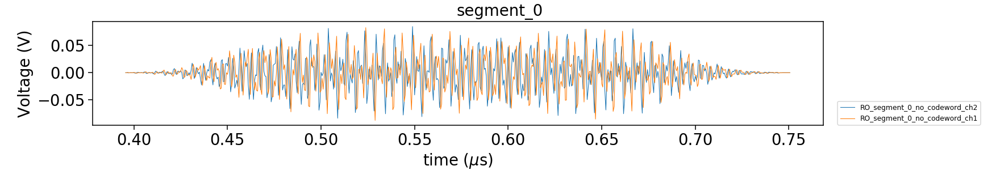

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718


<IPython.core.display.Javascript object>


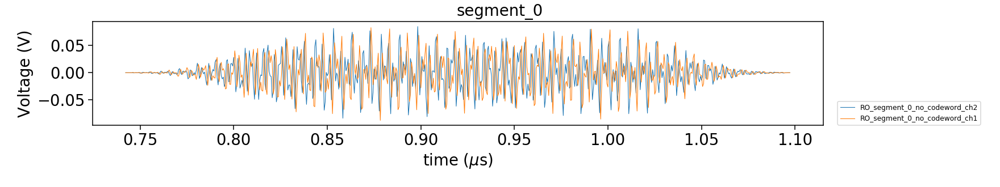

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718


<IPython.core.display.Javascript object>


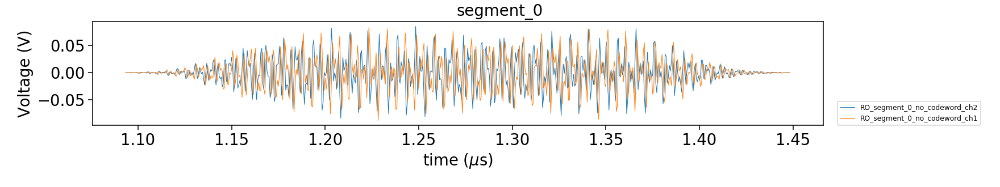

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718


<IPython.core.display.Javascript object>


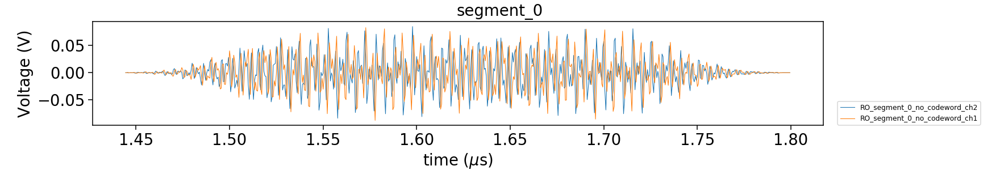

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718


<IPython.core.display.Javascript object>


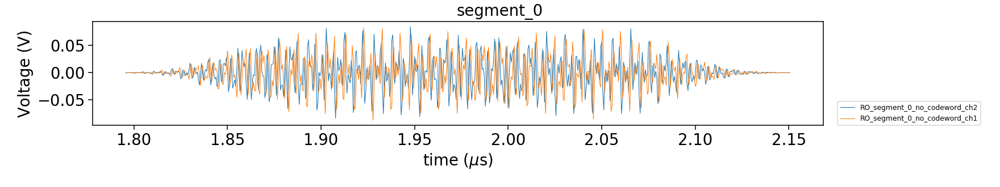

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_5:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_5:
phase 

<IPython.core.display.Javascript object>


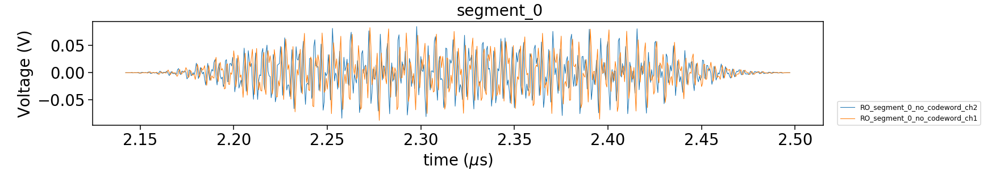

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_5:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_5:
phase 

<IPython.core.display.Javascript object>


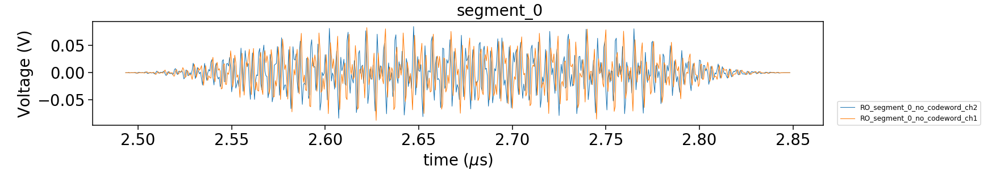

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_5:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_5:
phase 

<IPython.core.display.Javascript object>


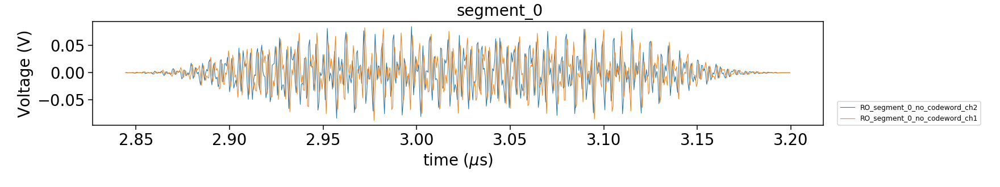

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_5:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_5:
phase 

<IPython.core.display.Javascript object>


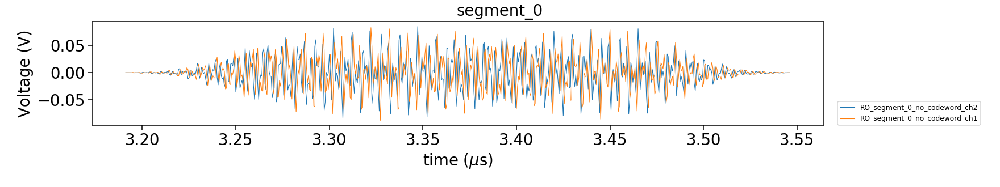

U_0:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_0:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_1:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_1:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_2:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_2:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_3:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_3:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_4:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_4:
phase angle: 3.141592653589793
Ampl: 0.4576490069478623
dyn_phase: -1086.443111071718
U_5:
phase angle: 3.141592653589793
Ampl: 1.572186925125178
dyn_phase: 6544.178017477893
U_5:
phase 

<IPython.core.display.Javascript object>


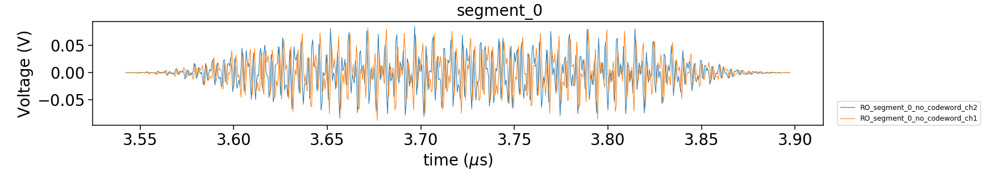

In [46]:
lengths_hw_worst_case = []
for d, opt_param in optimal_params.items():
    s, _ = qaoa.qaoa_sequence(qb_names, opt_param["b"], [np.pi/4]*d, 
                  two_qb_gate_info_worst, mqm.get_operation_dict(qbs), 
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="hardware", 
                              init_state="+",
                         upload=False)
    fig, axes = s.segments["segment_0"].plot(instruments=["UHF"])
    lengths_hw_worst_case.append(axes[0][0].lines[0].get_xdata()[0])

In [44]:
lengths_hw_worst_case

[0.3955555555555555,
 0.7422222222222221,
 1.0933333333333335,
 1.4444444444444442,
 1.7955555555555553,
 2.142222222222222,
 2.493333333333333,
 2.844444444444444,
 3.191111111111111,
 3.542222222222222]

Text(0, 0.5, 'Sequence Length ($\\mu s$)')

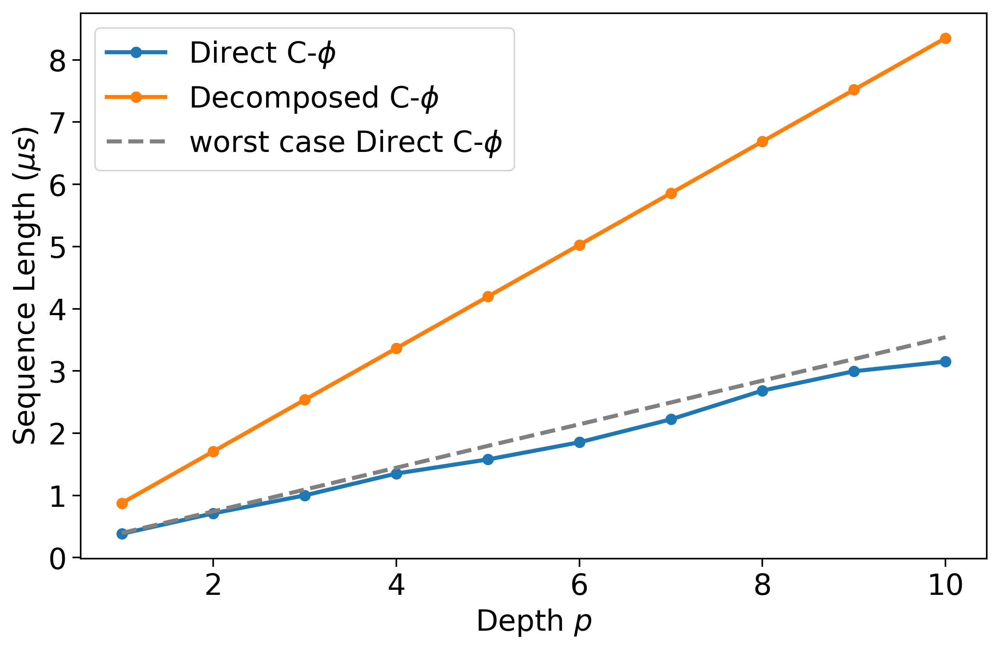

In [58]:
plt.plot(optimal_params.keys(), lengths_hw, '-o', label="Direct C-$\phi$")
plt.plot(optimal_params.keys(), lengths_sw, '-o', label="Decomposed C-$\phi$")
plt.plot(optimal_params.keys(), lengths_hw_worst_case, '--', color='grey', label="worst case Direct C-$\phi$")
plt.legend()
plt.xlabel("Depth $p$")
plt.ylabel("Sequence Length ($\mu s$)")

U_0:
phase angle: 4.7123890143591725
Ampl: 1.5959862507034714
dyn_phase: 5991.025784924869
U_0:
phase angle: 3.1415927215387587
Ampl: 0.4576490079334986
dyn_phase: -1086.4431178963544
AWG2
AWG1
UHF
AWG1
AWG1
AWG8
AWG1
AWG1


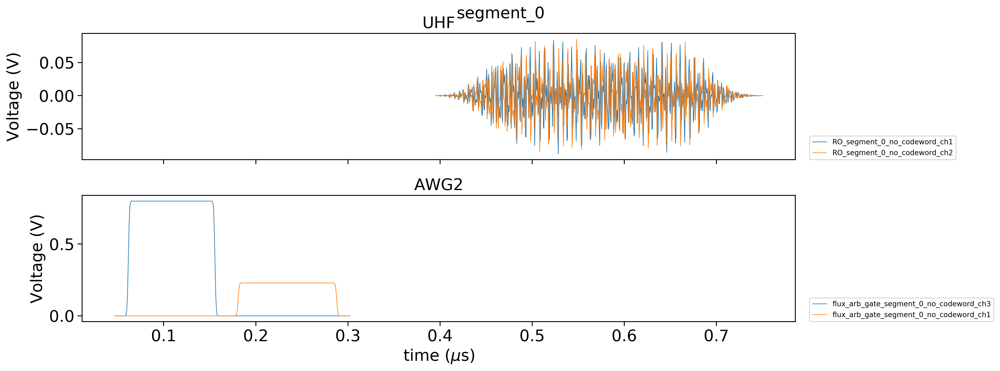

U_0:
phase angle: 4.107616687179586
Ampl: 1.5852532131911408
dyn_phase: 6489.840101866527
U_0:
phase angle: 1.9320480671795863
Ampl: 0.4368997727918133
dyn_phase: -751.2020146799174
U_1:
phase angle: 5.146556347179587
Ampl: 1.6074599171840005
dyn_phase: 5304.552900122978
U_1:
phase angle: 4.009927387179586
Ampl: 0.4704392060628822
dyn_phase: -1132.0942389522966
AWG2
AWG1
UHF
AWG1
AWG1
AWG8
AWG1
AWG1


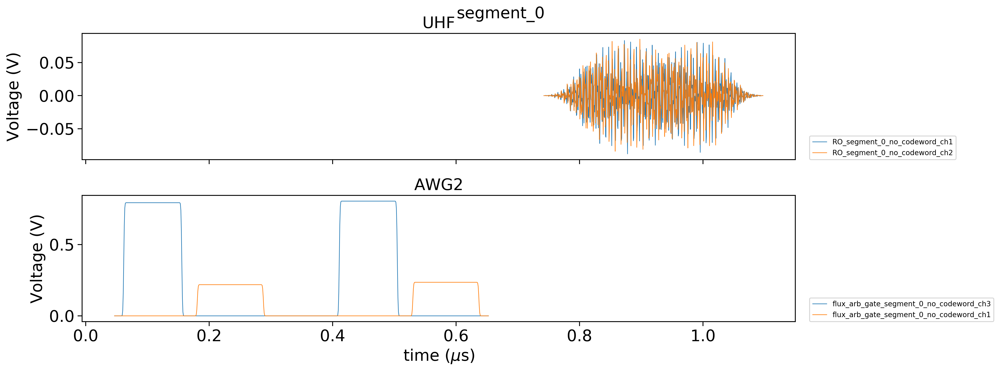

U_0:
phase angle: 4.054530154359172
Ampl: 1.5843770502991517
dyn_phase: 6522.745486401261
U_0:
phase angle: 1.8258750015387584
Ampl: 0.43471388148965634
dyn_phase: -707.6516441750055
U_1:
phase angle: 5.123961521538758
Ampl: 1.6067103161133902
dyn_phase: 5352.3625073782005
U_1:
phase angle: 3.9647377358979305
Ampl: 0.4697644091320917
dyn_phase: -1134.127257281664
U_2:
phase angle: 0.95317554
Ampl: 1.5393289513508415
dyn_phase: 3839.9040994969737
U_2:
phase angle: 1.90635108
Ampl: 0.4363707231648814
dyn_phase: -740.5879476873265
AWG2
AWG1
UHF
AWG1
AWG1
AWG8
AWG1
AWG1


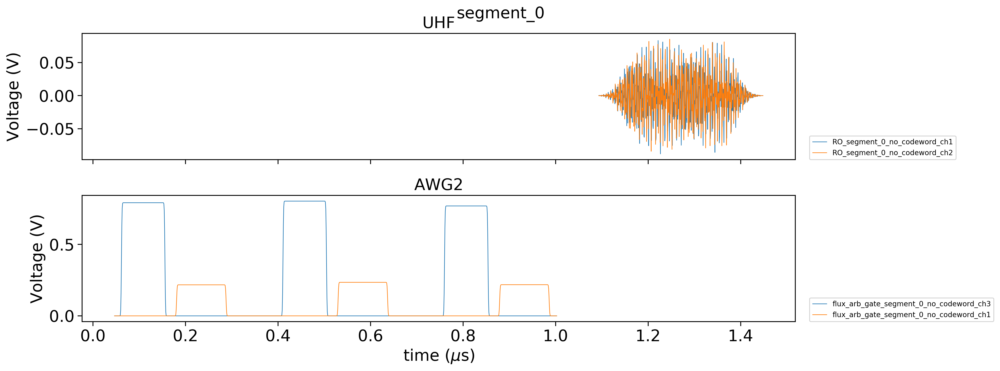

U_0:
phase angle: 4.350497707179587
Ampl: 1.589226852790179
dyn_phase: 6321.662955376117
U_0:
phase angle: 2.4178101071795863
Ampl: 0.4461998028177723
dyn_phase: -927.313114006605
U_1:
phase angle: 5.243098914359172
Ampl: 1.61066279260635
dyn_phase: 5109.820571402882
U_1:
phase angle: 4.203012521538758
Ampl: 0.47332246035565706
dyn_phase: -1121.754499776002
U_2:
phase angle: 1.0475449743591732
Ampl: 1.5418099040610078
dyn_phase: 4108.18502303235
U_2:
phase angle: 2.0950899487183463
Ampl: 0.4402564793971262
dyn_phase: -818.4569521517616
U_3:
phase angle: 0.5362981943591727
Ampl: 1.5199072184553273
dyn_phase: 2368.854803133823
U_3:
phase angle: 1.0725963887183454
Ampl: 0.4077274578155863
dyn_phase: -222.37178943342994
AWG2
AWG1
UHF
AWG1
AWG1
AWG8
AWG1
AWG1


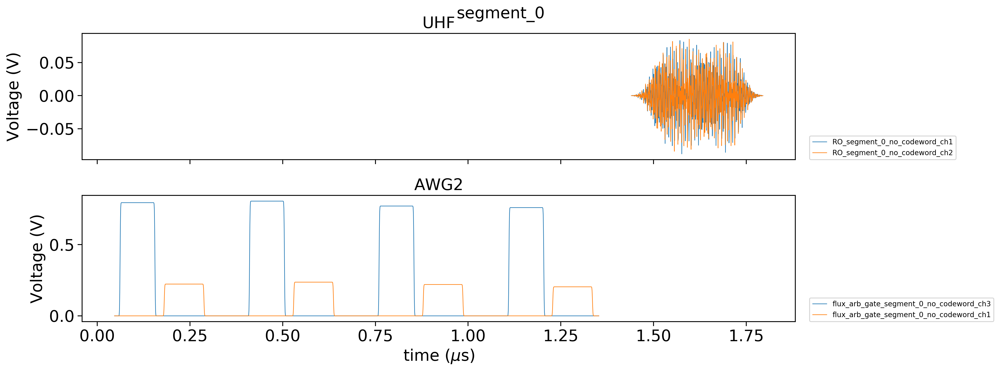

U_0:
phase angle: 5.8446134471795865
Ampl: 1.644132791328451
dyn_phase: 3492.850407160796
U_0:
phase angle: 5.406041587179586
Ampl: 0.4992945164035063
dyn_phase: -892.9662019396741
U_1:
phase angle: 4.219471187179586
Ampl: 1.5870934774854661
dyn_phase: 6412.764326850958
U_1:
phase angle: 2.155757067179586
Ampl: 0.44150549416156715
dyn_phase: -844.6705573386643
U_2:
phase angle: 4.599514967179586
Ampl: 1.5932813546798057
dyn_phase: 6136.4014491637645
U_2:
phase angle: 2.9158446271795864
Ampl: 0.45437441031965875
dyn_phase: -1054.6608685653462
U_3:
phase angle: 6.236134154359172
Ampl: 1.7236894316274711
dyn_phase: 1588.9881283669342
U_3:
phase angle: 6.189083001538759
Ampl: 0.5430080778824945
dyn_phase: -480.7113837435236
U_4:
phase angle: 5.435921034359173
Ampl: 1.617991154725886
dyn_phase: 4680.232381819945
U_4:
phase angle: 4.5886567615387595
Ampl: 0.4804134931571426
dyn_phase: -1084.2035138962879
AWG2
AWG1
UHF
AWG1
AWG1
AWG8
AWG1
AWG1


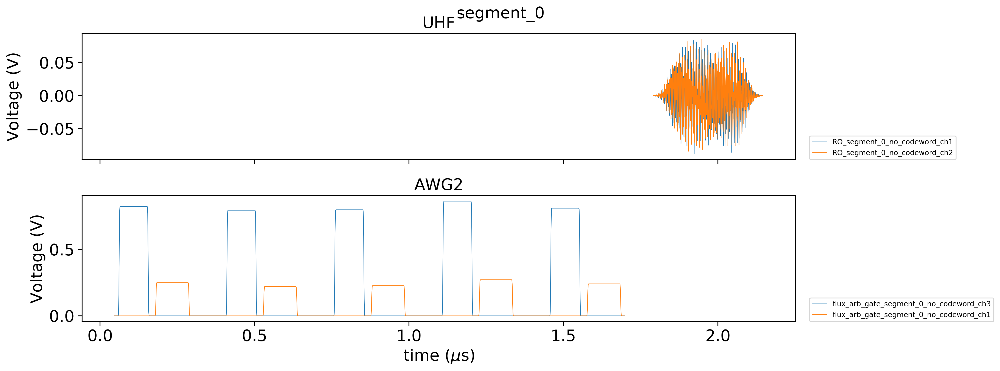

U_0:
phase angle: 2.2351476943591724
Ampl: 1.5617759151047728
dyn_phase: 5957.671455941087
U_0:
phase angle: 4.470295388718345
Ampl: 0.47819470738025965
dyn_phase: -1099.6389494205227
U_1:
phase angle: 4.514206394359173
Ampl: 1.591892359516572
dyn_phase: 6207.127355452837
U_1:
phase angle: 2.745227481538759
Ampl: 0.4516703052403697
dyn_phase: -1015.7157429745849
U_2:
phase angle: 1.3313187143591723
Ampl: 1.5482196147726355
dyn_phase: 4732.8461859461695
U_2:
phase angle: 2.6626374287183445
Ampl: 0.45029038737583726
dyn_phase: -996.709422716506
U_3:
phase angle: 5.189560621538758
Ampl: 1.60888661773097
dyn_phase: 5217.794944361665
U_3:
phase angle: 4.095935935897931
Ampl: 0.4717235334044486
dyn_phase: -1127.9670795535228
U_4:
phase angle: 5.6017933071795865
Ampl: 1.6264781376545745
dyn_phase: 4243.106832352153
U_4:
phase angle: 4.920401307179587
Ampl: 0.48711480610967217
dyn_phase: -1027.678379112761
U_5:
phase angle: 4.407250167179586
Ampl: 1.590150896996235
dyn_phase: 6282.845250170556

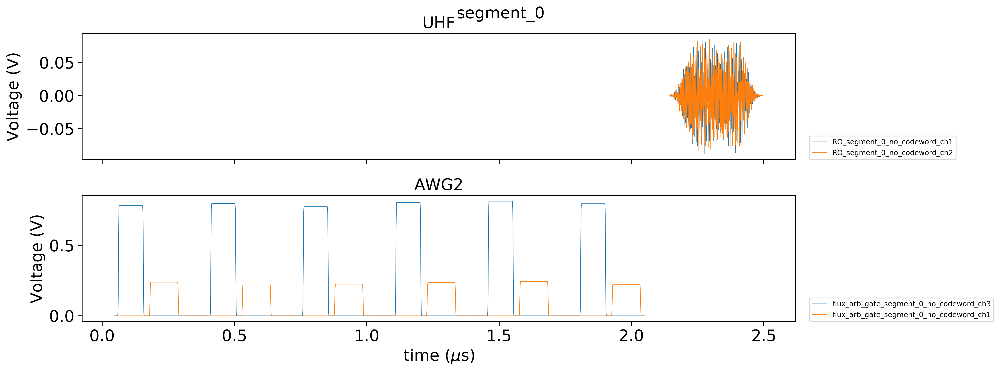

U_0:
phase angle: 3.067784567179586
Ampl: 1.5713795073342811
dyn_phase: 6524.647198192857
U_0:
phase angle: 6.135569134359172
Ampl: 0.5365778887565676
dyn_phase: -526.8102545726385
U_1:
phase angle: 0.5020147271795858
Ampl: 1.5171157929340873
dyn_phase: 2260.761800191332
U_1:
phase angle: 1.0040294543591717
Ampl: 0.40383268959489355
dyn_phase: -168.916225365419
U_2:
phase angle: 3.011094387179586
Ampl: 1.570759349542264
dyn_phase: 6507.156013827892
U_2:
phase angle: 6.022188774359172
Ampl: 0.5276526285032594
dyn_phase: -606.4711685326188
U_3:
phase angle: 3.618850427179586
Ampl: 1.5779067532350892
dyn_phase: 6638.447202919366
U_3:
phase angle: 0.9545155471795859
Ampl: 0.4006447230430166
dyn_phase: -127.80998676484036
U_4:
phase angle: 3.3619016671795863
Ampl: 1.5747517056236324
dyn_phase: 6613.47805367634
U_4:
phase angle: 0.4406180271795863
Ampl: 0.75
dyn_phase: 101.05313693
U_5:
phase angle: 1.1975011143591718
Ampl: 1.5455118460441697
dyn_phase: 4505.403634372256
U_5:
phase angle: 2.

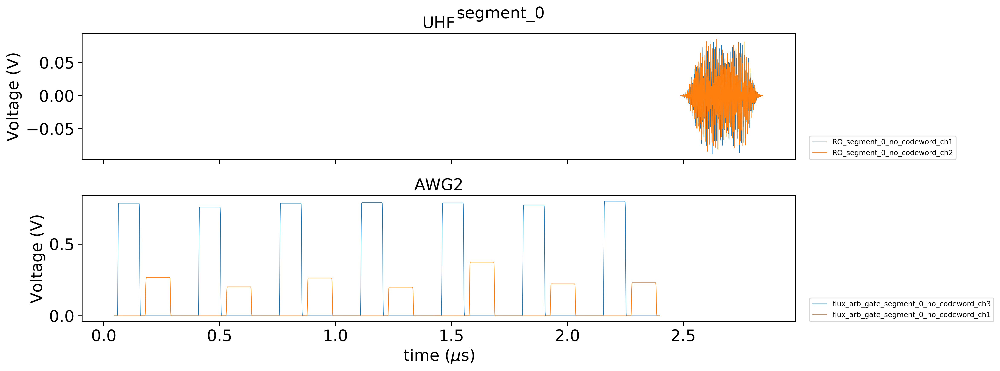

U_0:
phase angle: 5.44885391635057
Ampl: 1.6185274450525706
dyn_phase: 4651.190954003392
U_0:
phase angle: 4.614522525521554
Ampl: 0.4808983691590483
dyn_phase: -1080.1449809704277
U_1:
phase angle: 0.7826091985628905
Ampl: 1.5338927620677247
dyn_phase: 3339.404800145607
U_1:
phase angle: 1.565218397125781
Ampl: 0.427617513988118
dyn_phase: -563.9850130172225
U_2:
phase angle: 2.6162282446998275
Ampl: 1.5664141867129724
dyn_phase: 6285.773775824275
U_2:
phase angle: 5.232456489399655
Ampl: 0.49407509366647917
dyn_phase: -953.0843891171183
U_3:
phase angle: 3.283736173610967
Ampl: 1.5737919195021426
dyn_phase: 6587.670322659221
U_3:
phase angle: 0.28428704004234806
Ampl: 0.638892092173441
dyn_phase: -79.8732412344538
U_4:
phase angle: 4.618382681607001
Ampl: 1.5937124803713345
dyn_phase: 6113.231659435595
U_4:
phase angle: 2.953580056034415
Ampl: 0.4549217830256655
dyn_phase: -1063.1570410999532
U_5:
phase angle: 0.03338784974350428
Ampl: 1.7727147282799929
dyn_phase: 949.4406287902568


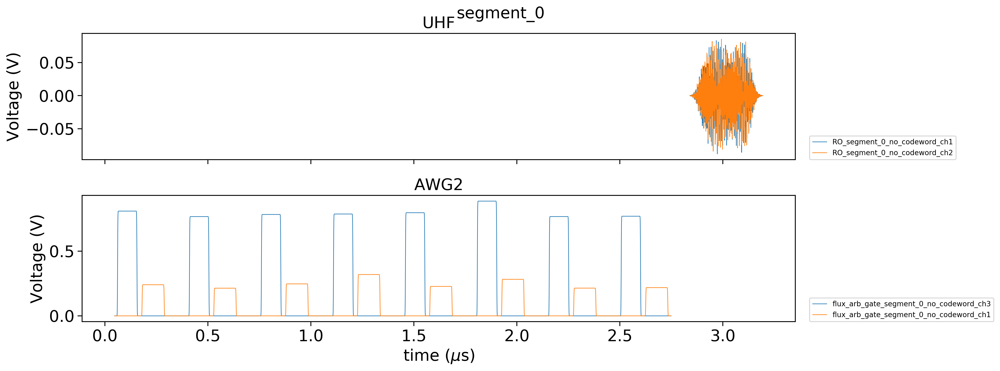

U_0:
phase angle: 4.36830056518683
Ampl: 1.5895167191288861
dyn_phase: 6310.802811133786
U_0:
phase angle: 2.4534158231940744
Ampl: 0.44679470452723963
dyn_phase: -937.1128874317341
U_1:
phase angle: 4.045376001155545
Ampl: 1.584225966230962
dyn_phase: 6527.4763122434815
U_1:
phase angle: 1.807566695131504
Ampl: 0.43433695003824446
dyn_phase: -700.0914686692844
U_2:
phase angle: 0.9950986304940495
Ampl: 1.5405151699993171
dyn_phase: 3967.873980766659
U_2:
phase angle: 1.990197260988099
Ampl: 0.43809694851812664
dyn_phase: -775.133603350272
U_3:
phase angle: 5.500245876778065
Ampl: 1.6208760848540007
dyn_phase: 4524.711650663279
U_3:
phase angle: 4.7173064463765435
Ampl: 0.4828251421953102
dyn_phase: -1066.5710500046766
U_4:
phase angle: 4.970981280130225
Ampl: 1.6025281377254634
dyn_phase: 5617.496698629726
U_4:
phase angle: 3.6587772530808635
Ampl: 0.46519563754628546
dyn_phase: -1125.6931515159886
U_5:
phase angle: 5.327387336367663
Ampl: 1.6134905668143233
dyn_phase: 4935.6938815506

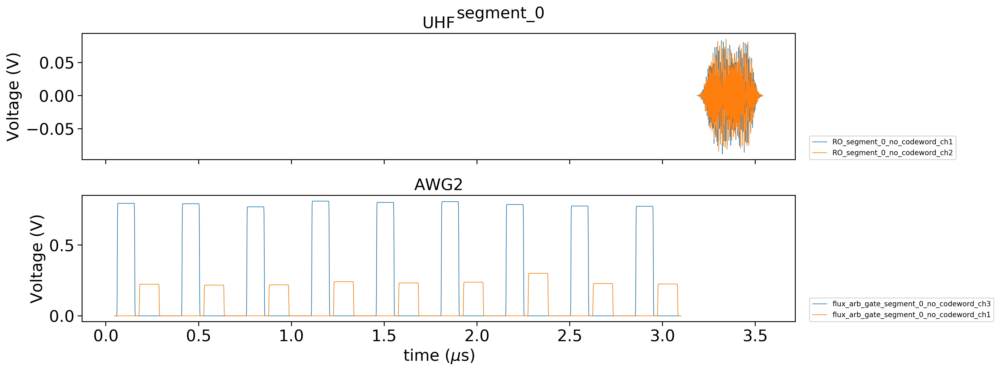

U_0:
phase angle: 2.7261617101780264
Ampl: 1.5676423507985169
dyn_phase: 6375.732652864337
U_0:
phase angle: 5.452323420356053
Ampl: 0.5007102070901723
dyn_phase: -878.851391737158
U_1:
phase angle: 1.8764704535833427
Ampl: 1.556990393775192
dyn_phase: 5517.642214242678
U_1:
phase angle: 3.7529409071666855
Ampl: 0.4666017414432394
dyn_phase: -1128.0130426568282
U_2:
phase angle: 3.319282083198859
Ampl: 1.5742283840997624
dyn_phase: 6599.245477719191
U_2:
phase angle: 0.35537885921813217
Ampl: 0.6809396214647453
dyn_phase: 4.861782706068986
U_3:
phase angle: 3.60559827621584
Ampl: 1.5777440314253213
dyn_phase: 6641.340295170254
U_3:
phase angle: 0.9280112452520939
Ampl: 0.3986879327655242
dyn_phase: -103.38017388349635
U_4:
phase angle: 1.29130591671455
Ampl: 1.5475057059306592
dyn_phase: 4672.699161058512
U_4:
phase angle: 2.5826118334291
Ampl: 0.44895331656902243
dyn_phase: -976.7308147534446
U_5:
phase angle: 6.136761001732989
Ampl: 1.6917714855692827
dyn_phase: 2167.344055294307
U_5

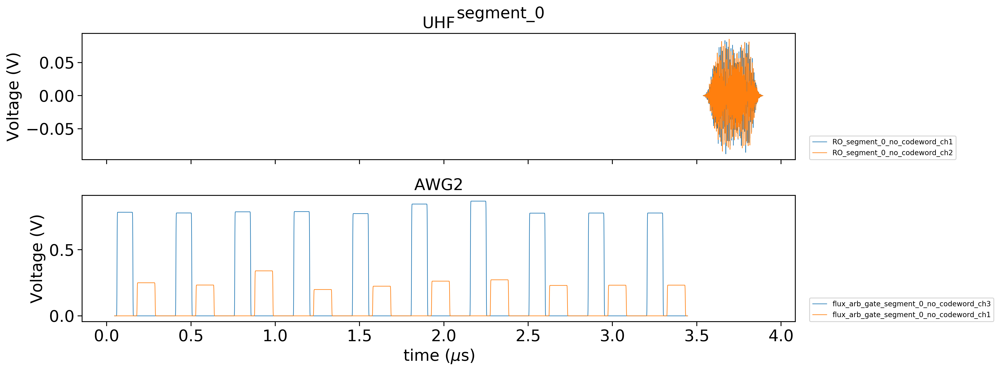

In [29]:
for d, opt_param in optimal_params.items():
    s, _ = qaoa.qaoa_sequence(["qb1", "qb2", "qb3"], opt_param["g"], opt_param["b"], 
                  two_qb_gate_info, mqm.get_operation_dict(qbs),
                              init_state="+",
                         single_qb_terms={f"qb{i}": 0 for i in range(1,4)},
                         cphase_implementation="hardware", 
                         upload=False)
    fig, axes = s.segments["segment_0"].plot(instruments=["UHF", "AWG2"])